Table of content 
- [About the task and the dataset](#1)
  - [Features exploring and validation](#1.1)
  - [Filling the missing values](#1.2)
  - [Data Exploratory Analysis](#1.3)
  - [Encoding](#1.4) 
- [Feature extraction and engineering](#2)
- [Model](#3)
  - [Decision Tree](#3.1)
  - [GridSearch DT](#3.2)
  - [Saving the model](#3.3)
  - [SVM Model](#3.4)
  - [GridSearch SVM](#3.5)
  - [Saving the SVM](#3.6)

In [25]:
import numpy as np 
import pandas as pd
# for plotting 
import matplotlib.pyplot as plt 
import plotly.express as px
import plotly.graph_objects as go 
import seaborn as sns 
import matplotlib.image as mpimg

# preprocessing 
from sklearn.preprocessing import LabelEncoder
# some useful tools
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
# for models 
from sklearn.tree import DecisionTreeClassifier as DTC
from sklearn.svm import SVC 

from sklearn.tree import plot_tree, export_text
# Evaluation 
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
# saving the models 
import joblib
# warnings
import warnings

# Filter out the specific warning related to the figure layout change (sns.pairplot)
warnings.filterwarnings("ignore", message="The figure layout has changed to tight")

<h1 style="color : skyblue" id="1">About the task and the dataset <h1>

- dataset :  <span style="color:salmon">Bank Client Attributes and Marketing Outcomes</span> 
- insight into the attributes of <span style="color:salmon">bank clients</span> and the outcomes of <span style="color:salmon"> marketing campaigns. </span>
- This dataset serves as a valuable resource for analyzing customer behavior, optimizing marketing strategies, and enhancing client engagement in the banking sector.

- We have <span style="color:salmon">45211 rows</span> and <span style="color:salmon">18 columns</span>
- Each observation : the person contacted by the marketing company has <span style ="color:salmon">16 feature</span> 
- and The targe `y` one categorical (`"yes"` or `"no"` that depends if the person is interested to adquire the product) 

In [3]:
marketing = pd.read_csv("Bank_marketing.csv")
display(marketing.sample(3))
print(marketing.shape)

,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
28142,29143,32.0,blue-collar,married,secondary,no,257.0,yes,yes,cellular,29,jan,74,1,239,1,other,no
14112,15113,43.0,admin.,married,primary,no,392.0,yes,yes,cellular,11,jul,87,2,-1,0,unknown,no
10040,11041,59.0,admin.,married,unknown,no,0.0,no,no,unknown,11,jun,242,2,-1,0,unknown,no


(45211, 18)


<h2 style="color : salmon" id="11">Features exploring and validation<h2>

<details>
  <summary style="color:red">Features description details</summary>
  <ul>
    <li><strong>Id:</strong> Numeric identifier for clients.</li>
    <li><strong>age:</strong> Age of the client (numeric).</li>
    <li><strong>job:</strong> Type of work the client is engaged in (categorical).</li>
      <ul>
        <li>Possible values: "admin.", "unknown", "unemployed", "management", "housemaid", "entrepreneur", "student", "blue-collar", "self-employed", "retired", "technician", "services"</li>
      </ul>
    <li><strong>marital:</strong> Civil status of the client (categorical).</li>
      <ul>
        <li>Possible values: "married", "divorced", "single"</li>
      </ul>
    <li><strong>education:</strong> Level of education of the client (categorical).</li>
      <ul>
        <li>Possible values: "unknown", "secondary", "primary", "tertiary"</li>
      </ul>
    <li><strong>default:</strong> Whether the client has defaulted on any obligations (categorical).</li>
      <ul>
        <li>Possible values: "yes", "no"</li>
      </ul>
    <li><strong>balance:</strong> Annual balance in euros for the client (numeric).</li>
    <li><strong>housing:</strong> Whether the client has a mortgage credit (categorical).</li>
      <ul>
        <li>Possible values: "yes", "no"</li>
      </ul>
    <li><strong>loan:</strong> Whether the client has consumer loans (categorical).</li>
      <ul>
        <li>Possible values: "yes", "no"</li>
      </ul>
    <li><strong>contact:</strong> Medium through which the client was contacted (categorical).</li>
      <ul>
        <li>Possible values: "unknown", "telephone", "cellular"</li>
      </ul>
    <li><strong>day:</strong> The last day the client was contacted (numeric).</li>
    <li><strong>month:</strong> The last month the client was contacted (categorical).</li>
      <ul>
        <li>Possible values: "jan", "feb", "mar", ..., "nov", "dec"</li>
      </ul>
    <li><strong>duration:</strong> Length of time (in seconds) of the last contact with the client (numeric).</li>
    <li><strong>campaign:</strong> Total number of times the client was contacted during the campaign (numeric).</li>
    <li><strong>pdays:</strong> Number of days elapsed after the client was last contacted before the current campaign (numeric).</li>
    <li><strong>previous:</strong> Number of times the client had been contacted before this campaign (numeric).</li>
    <li><strong>poutcome:</strong> Result of the last marketing campaign (categorical).</li>
      <ul>
        <li>Possible values: "unknown", "other", "failure", "success"</li>
      </ul>
    <li><strong>y:</strong> Whether the client subscribed to the product (fixed deposit) (categorical).</li>
      <ul>
        <li>Possible values: "yes", "no"</li>
      </ul>
  </ul>
</details>


- Some columns have missing values, we would deal with this later 

In [206]:
# features info 
marketing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 18 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Id         45211 non-null  int64  
 1   age        45199 non-null  float64
 2   job        45210 non-null  object 
 3   marital    45211 non-null  object 
 4   education  45211 non-null  object 
 5   default    45211 non-null  object 
 6   balance    45208 non-null  float64
 7   housing    45211 non-null  object 
 8   loan       45211 non-null  object 
 9   contact    45211 non-null  object 
 10  day        45211 non-null  int64  
 11  month      45211 non-null  object 
 12  duration   45211 non-null  int64  
 13  campaign   45211 non-null  int64  
 14  pdays      45211 non-null  int64  
 15  previous   45211 non-null  int64  
 16  poutcome   45211 non-null  object 
 17  y          45211 non-null  object 
dtypes: float64(2), int64(6), object(10)
memory usage: 6.2+ MB


- `Id` column validated to be unique with 45211 distict values 
- `age` 
    - some missing data ❌
    - mean 41 years
    - min -1 ⚠️ we need to fic this 
    - max 95 
- `balance`
    - some missing data ❌
    - mean 1362
    - min -8019 
    - max 102127
- `day` (the last day the client was contacted)
    - mean 16
    - the range from 1 to 31 (month days)
- `duration` 📞⏳ in s
    - mean 258s
    - min 0s
    - max 4918s (81 min)
- `campagin` _during this campaign_
    - on average the client was contacted 3 times 
    - min 1 time 
    - max 63 times (that's a spam😀)
- `pdays` days elapsed after the client was last contacted before the current campaign 
    - min 40 days
    - max 871 days
    - alot of `-1` values maybe it indicates the client wasn't contacted before (we would further check this)
- `previous` number of times the client was contacted before this campaign
    - mean 0.58
    - min 0 
    - max 275 

In [207]:
marketing.describe()

,Id,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45199.000000,45208.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,23606.000000,40.933627,1362.346620,15.806419,258.163080,2.763841,40.197828,0.580323
std,13051.435847,10.623149,3044.852387,8.322476,257.527812,3.098021,100.128746,2.303441
min,1001.000000,-1.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,12303.500000,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,23606.000000,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,34908.500000,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,46211.000000,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


- `job`
    - 12 unique values
    - the most of our clients working as blue-collar 🧑‍🏭⚒️👷‍♂️
     >Blue-Collar Workers The term blue-collar worker references individuals who engage in hard manual labor, typically in the agriculture, manufacturing, construction, mining, or maintenance sectors of the economy.
    - about 21% of our clients 
- `marital`
    - 3 unique values (married, single, divorced)
    - married 60%
- `education`
    - secondary 51%
- `default`
    - most of our clients never defaulted 98%
- `housing`  mortgage credit 
    - `yes` => 55%
- `loan`
    - `no` => 83%
- `contact`
    -  "`unknown`", "`telephone`", "`cellular`"
    - 64% of our clients contacted with cellular phone
- `month`
    - in may 30%
- `poutcome`
    - Result of the last marketing campaign 
    - "`unknown`", "`other`", "`failure`", "`success`"
    - 81% is unknown 
- `y` the target
    - Whether the client subscribed to the product (fixed deposit)
    - `no` => 88%

In [208]:
marketing.describe(include="O")

,job,marital,education,default,housing,loan,contact,month,poutcome,y
count,45210,45211,45211,45211,45211,45211,45211,45211,45211,45211
unique,12,3,4,2,2,2,3,12,4,2
top,blue-collar,married,secondary,no,yes,no,cellular,may,unknown,no
freq,9732,27214,23202,44396,25130,37967,29285,13766,36959,39922


<h2 style="color : salmon" id="12">Filling the missing values<h2>

- Columns with missing values 
    - `age`  12 (0.02%)
    - `job`  1(0.002%)
    - `balance`  3(0.006%)
- options we have
    - drop 
    - using single point imputation (like mean)
    - random sample from the same field ✅ 

In [209]:
# let's check for the missing values in the columns
marketing.isnull().sum()[marketing.isnull().sum() > 0]

age        12
job         1
balance     3
dtype: int64

In [4]:
for col in ["age", "job", "balance"]:
    # loan[col].dropna() ⚠️using this to prevent the sampling from the missing data 
    marketing.loc[marketing[col].isnull(), col] = np.random.choice(marketing[col].dropna(), size=marketing[col].isnull().sum())

In [211]:
marketing.isnull().sum()

Id           0
age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [5]:
# validation 
# selecting all columns except the Loan_ID
for col in marketing.select_dtypes(include="O").columns:
    display(marketing[col].value_counts().reset_index())

,job,count
0,blue-collar,9732
1,management,9459
2,technician,7596
3,admin.,5171
4,services,4154
5,retired,2264
6,self-employed,1579
7,entrepreneur,1487
8,unemployed,1303
9,housemaid,1240


,marital,count
0,married,27214
1,single,12790
2,divorced,5207


,education,count
0,secondary,23202
1,tertiary,13301
2,primary,6851
3,unknown,1857


,default,count
0,no,44396
1,yes,815


,housing,count
0,yes,25130
1,no,20081


,loan,count
0,no,37967
1,yes,7244


,contact,count
0,cellular,29285
1,unknown,13020
2,telephone,2906


,month,count
0,may,13766
1,jul,6895
2,aug,6247
3,jun,5341
4,nov,3970
5,apr,2932
6,feb,2649
7,jan,1403
8,oct,738
9,sep,579


,poutcome,count
0,unknown,36959
1,failure,4901
2,other,1840
3,success,1511


,y,count
0,no,39922
1,yes,5289


In [5]:
# fixing the age 
# all of them bought the product 
marketing[marketing["age"]<=0]

,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
45203,46204,-1.0,student,single,tertiary,no,113.0,no,no,cellular,17,nov,266,1,-1,0,unknown,yes
45204,46205,-1.0,retired,married,secondary,no,2850.0,no,no,cellular,17,nov,300,1,40,8,failure,yes
45205,46206,-1.0,technician,single,secondary,no,505.0,no,yes,cellular,17,nov,386,2,-1,0,unknown,yes


In [6]:
marketing.loc[marketing["age"]<=0, "age"] = [marketing["age"].mean() for _ in range(len(marketing[marketing["age"]<=0]))]

In [7]:
# let's be sure 
# perfecto✅
marketing[marketing["age"]<=0]

,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y


In [216]:
marketing["age"].min()

18.0

<h2 style="color : salmon" id="13">Data Exploratory Analysis<h2>

In [8]:
warnings.filterwarnings("ignore", message="The figure layout has changed to tight")

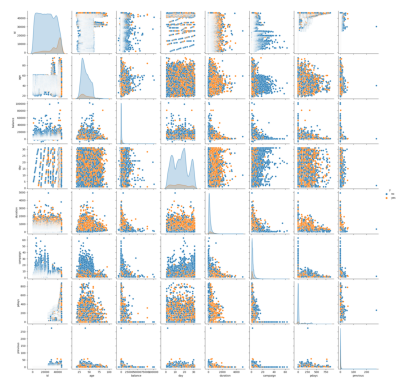

In [10]:
# fig_pair_plot = sns.pairplot(data=marketing, hue="y");
# # Save the plot as an image
# fig_pair_plot.savefig('pairplot.png')
# Load the saved image
img = mpimg.imread('pairplot.png')

# Display the image
plt.imshow(img)
plt.axis('off')  # Turn off axis
plt.show()

In [219]:
marketing.columns

Index(['Id', 'age', 'job', 'marital', 'education', 'default', 'balance',
       'housing', 'loan', 'contact', 'day', 'month', 'duration', 'campaign',
       'pdays', 'previous', 'poutcome', 'y'],
      dtype='object')

### `age` distribution 

In [220]:
px.histogram(data_frame=marketing, x="age", color="y", title="Age distribution")

In [221]:
px.box(data_frame=marketing, x='age', color="y", title="Box plot for age")

### `job` distribution 

In [222]:
px.sunburst(data_frame=marketing, path=["y", "job"], title="Which jobs bought the product?")

In [223]:
g1 = marketing.groupby("job")["y"].value_counts().reset_index().style.bar()
g1

,job,y,count
0,admin.,no,4540
1,admin.,yes,631
2,blue-collar,no,9024
3,blue-collar,yes,708
4,entrepreneur,no,1364
5,entrepreneur,yes,123
6,housemaid,no,1131
7,housemaid,yes,109
8,management,no,8157
9,management,yes,1301


### sunbrust graphs to show the distribution of the categorical features 

In [11]:
cat_cols = marketing.select_dtypes(include="O").columns
for col in cat_cols:
    if col not in ["y", "job"]:
        fig = px.sunburst(data_frame=marketing, path=["y", col], title=f"{col} distribution with the target")
        fig.show()
    

### distribution plots for numerical 

In [225]:
marketing.dtypes

Id             int64
age          float64
job           object
marital       object
education     object
default       object
balance      float64
housing       object
loan          object
contact       object
day            int64
month         object
duration       int64
campaign       int64
pdays          int64
previous       int64
poutcome      object
y             object
dtype: object

In [12]:
num_cols = marketing.select_dtypes(include=["int", "float"]).columns
num_cols

Index(['Id', 'age', 'balance', 'day', 'duration', 'campaign', 'pdays',
       'previous'],
      dtype='object')

In [13]:
for col in num_cols:
    if col not in ["Id", "age"]:
        fig = px.histogram(data_frame=marketing, x=col, title=f"distribution of {col}", color="y")
        fig.show()
        fig1 =px.box(data_frame=marketing, x=col, title=f"box plot of {col}", color="y")
        fig1.show()

### Correlation

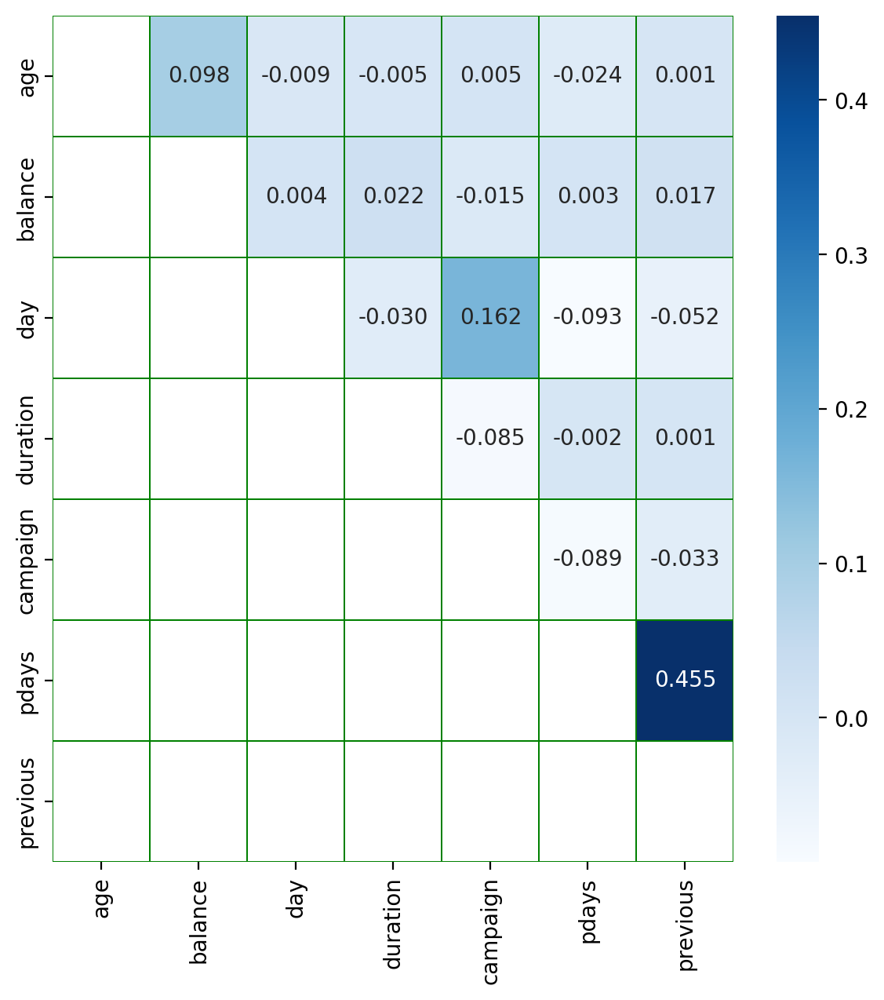

In [228]:
# numeric_only=True by default now is set to be False these days😔 
corr = marketing.drop(columns=["Id"]).corr(numeric_only=True)
plt.figure(figsize=(7, 7), dpi = 200)
sns.heatmap(corr, annot=True, cmap="Blues", linecolor="green",linewidths=0.1, fmt=".3f", mask=np.tril(corr))
plt.show()

<h2 style="color : salmon" id="14">Encoding<h2>

In [14]:
cat_cols

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'month', 'poutcome', 'y'],
      dtype='object')

In [15]:
# label encoder
encoder = LabelEncoder()
for col in cat_cols:
    marketing[col] = encoder.fit_transform(marketing[col])

In [231]:
marketing.sample(2)

,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
5054,6055,32.0,1,2,1,0,5252.0,1,0,2,21,8,1162,2,-1,0,3,0
6,1007,28.0,4,2,2,0,447.0,1,1,2,5,8,217,1,-1,0,3,0


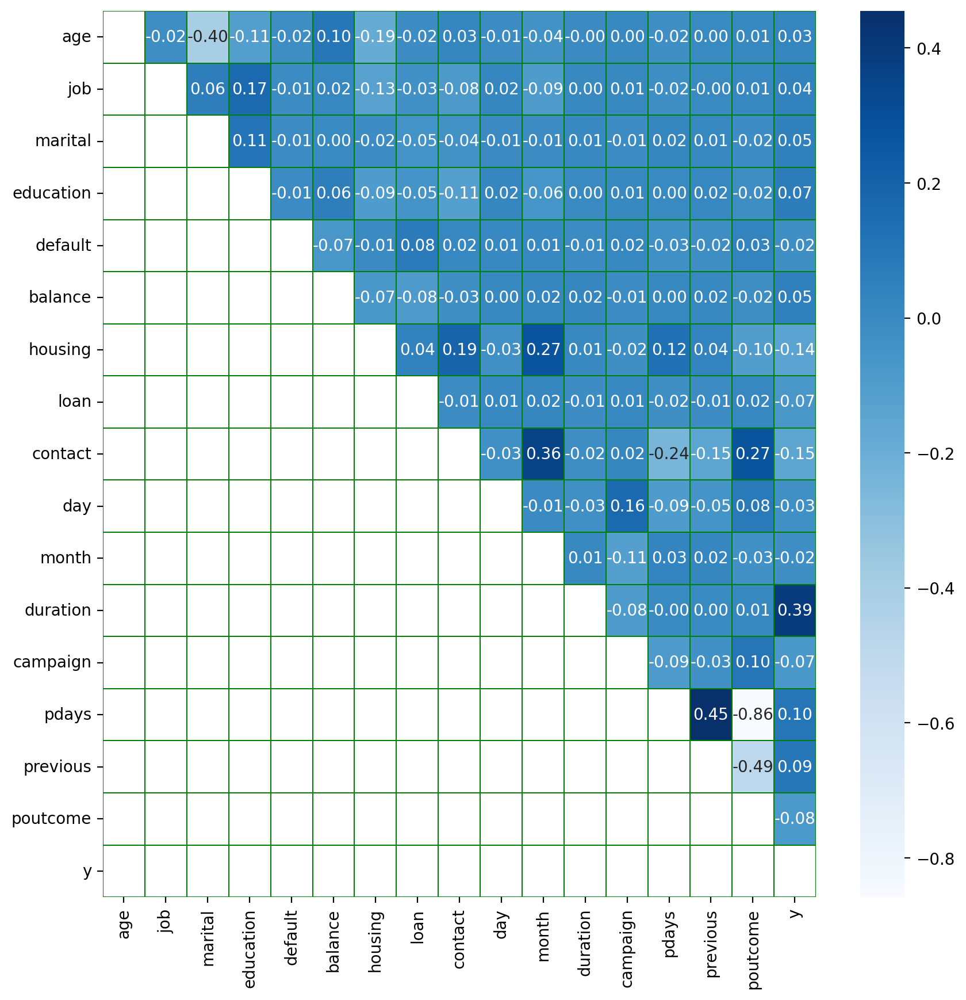

In [17]:
# numeric_only=True by default now is set to be False these days😔 
corr = marketing.drop(columns=["Id"]).corr(numeric_only=True)
plt.figure(figsize=(10, 10), dpi = 200)
sns.heatmap(corr, annot=True, cmap="Blues", linecolor="green",linewidths=0.1, fmt=".2f", mask=np.tril(corr))
plt.show()

In [18]:
corr[["y"]].sort_values(by="y", ascending=False).style.bar(color="red")

,y
y,1.000000
duration,0.394521
pdays,0.103621
previous,0.093236
education,0.066241
balance,0.052829
marital,0.045588
job,0.040451
age,0.025173
default,-0.022419


### Parallel Coordinates Plot (PCP)

>Parallel Coordinates Plot, also known as a Parallel Coordinate Plot or PCP, is a <span style="color:salmon">multivariate data visualization technique</span> used to display and explore relationships among multiple numeric variables. 

- Vertical Axes: Each numeric variable in your dataset is represented by a vertical axis or a parallel line on the plot. 
- Data Lines: Data points in your dataset are represented as lines that connect values for each variable along the respective axes. Each line represents an individual data point, and its path along the axes reveals how that data point's values compare across variables.

Interpreting a Parallel Coordinates Plot:
- Patterns: Parallel Coordinates Plots are excellent for identifying patterns in your data.
   -  Patterns may manifest as lines that follow a specific trajectory or show clustering of data points.
- Outliers: Outliers are data points that deviate significantly from the norm.
   - lines that stand out from the majority of the data.
- Correlations: By examining how lines move in relation to each other, you can infer correlations or dependencies between variables.
   -  Variables that move together or exhibit similar trends suggest a positive correlation, while those moving in opposite directions suggest a negative correlation.

In [234]:
float_cols = marketing.select_dtypes(include="float64").columns
float_cols

Index(['age', 'balance'], dtype='object')

In [235]:
px.parallel_coordinates(marketing.loc[:, [*float_cols, "y"]],  color="y")

In [236]:
marketing.dtypes

Id             int64
age          float64
job            int32
marital        int32
education      int32
default        int32
balance      float64
housing        int32
loan           int32
contact        int32
day            int64
month          int32
duration       int64
campaign       int64
pdays          int64
previous       int64
poutcome       int32
y              int32
dtype: object

In [237]:
marketing.drop(columns=["Id"]).select_dtypes(include="int").columns

Index(['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'day', 'month', 'duration', 'campaign', 'pdays', 'previous', 'poutcome',
       'y'],
      dtype='object')

In [239]:
# catEnc_cols = marketing.drop(columns=["Id", "month", "day", "pdays"]).select_dtypes(include="int").columns
px.parallel_categories(marketing, dimensions=['job', 'marital', 'education', 'default', 'housing','loan', 'contact','poutcome'],  color="y")

<h1 style="color : skyblue" id="2">Feature extraction and engineering<h1>

### age_cat 

In [19]:
marketing["age_cat"] = pd.cut(marketing["age"], bins=[18, 30, 40, 50, 100], labels=['Young Adults', 'Middle-Aged', 'Midlife', 'Senior'])

In [15]:
marketing["age_cat"].value_counts()

age_cat
Middle-Aged     17689
Midlife         11240
Senior           9254
Young Adults     7016
Name: count, dtype: int64

In [20]:
# let's encode it 
marketing["age_cat"] = encoder.fit_transform(marketing["age_cat"])

In [17]:
marketing

,Id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y,age_cat
0,1001,48.0,4,1,2,0,2143.0,1,0,2,5,8,261,1,-1,0,3,0,1
1,1002,32.0,0,2,1,0,29.0,1,0,2,5,8,151,1,-1,0,3,0,0
2,1003,35.0,2,1,1,0,2.0,1,1,2,5,8,76,1,-1,0,3,0,0
3,1004,47.0,1,1,3,0,1506.0,1,0,2,5,8,92,1,-1,0,3,0,1
4,1005,33.0,11,2,3,0,1.0,0,0,2,5,8,198,1,-1,0,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,46207,51.0,9,1,2,0,825.0,0,0,0,17,9,977,3,-1,0,3,1,2
45207,46208,71.0,5,0,0,0,1729.0,0,0,0,17,9,456,2,-1,0,3,1,2
45208,46209,72.0,5,1,1,0,5715.0,0,0,0,17,9,1127,5,184,3,2,1,2
45209,46210,57.0,1,1,1,0,668.0,0,0,1,17,9,508,4,-1,0,3,0,2


### contacted before or not

In [21]:
marketing[marketing["pdays"] == -1]["pdays"].shape

(36954,)

In [22]:
def mapContact(x):
    return 1 if x==-1 else 0
marketing["isContactedBefore"] = marketing["pdays"].apply(mapContact)
marketing[["isContactedBefore"]]

,isContactedBefore
0,1
1,1
2,1
3,1
4,1
...,...
45206,1
45207,1
45208,0
45209,1


<h1 style="color : skyblue" id="3">Model<h1>

In [23]:
X = marketing.drop(columns=["Id", "y"])
y = marketing["y"]

In [24]:
X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

for p in [X_train, X_test , y_train, y_test]:
    print(p.shape)

(36168, 18)
(9043, 18)
(36168,)
(9043,)


<h2 style="color : salmon" id="31">Decision Tree<h2>

In [21]:
tree = DTC(random_state=42)
tree.fit(X_train, y_train)
print(f"train score : {tree.score(X_train, y_train)}")
print(f"test score : {tree.score(X_test, y_test)}")
print(f"cross validation score : {cross_val_score(tree, X_train, y_train, cv=5).mean()}")
print(f"tree depth : {tree.get_depth()}")
print(f"tree parameters :{tree.get_params()}")


train score : 1.0
test score : 0.869844078292602
cross validation score : 0.8744747228598259
tree depth : 28
tree parameters :{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 42, 'splitter': 'best'}


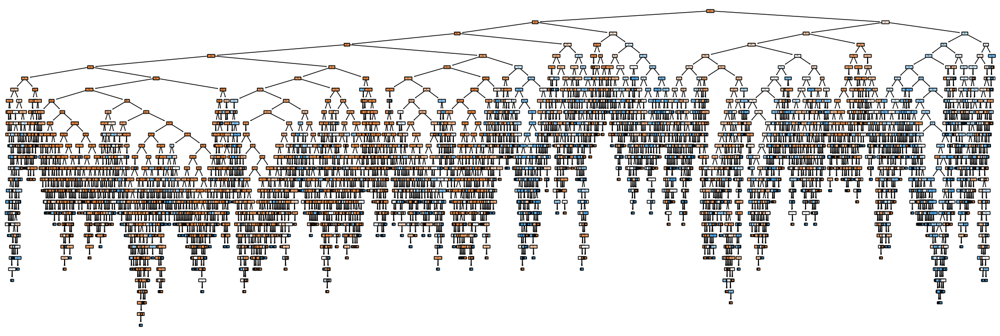

In [24]:
plt.figure(figsize=(24, 8))
plot_tree(tree, feature_names=marketing.drop(columns="Id").columns, filled=True,  label="none", rounded=True);
# Value => (#class1, #class2)

In [25]:
imp = tree.feature_importances_
features_names = tree.feature_names_in_
# argsort Returns the indices that would sort an array.
sorted_indices = np.argsort(imp)[::-1]  # descending 
# actually sort this array imp[indexes]
sorted_imp = imp[sorted_indices]
sorted_features_names = [features_names[i] for i in sorted_indices]

fig = px.bar(x=sorted_features_names, y=sorted_imp, labels={'x': 'Feature', 'y': 'Importance'}, title="Feature importance ")
fig.show()

<h2 style="color : salmon" id="32">GridSearch<h2>

In [40]:
tree2 = DTC()

param_grid = {
    'max_depth': [4, 6, 10, 12],
}

grid_search = GridSearchCV(tree2, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

In [45]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'max_depth': [4, 6, 10, 12]}, scoring='accuracy')

In [50]:
pd.DataFrame(grid_search.cv_results_).style.background_gradient()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.120948,0.008748,0.012207,0.009016,4,{'max_depth': 4},0.889549,0.891346,0.892729,0.896309,0.897553,0.893497,0.003005,4
1,0.164247,0.022574,0.009799,0.003123,6,{'max_depth': 6},0.896599,0.898811,0.902405,0.900456,0.901977,0.900050,0.002139,1
2,0.172899,0.054658,0.006786,0.002148,10,{'max_depth': 10},0.897014,0.900608,0.899364,0.896723,0.900733,0.898889,0.001720,2
3,0.192431,0.002492,0.005004,0.002617,12,{'max_depth': 12},0.894664,0.897152,0.893835,0.893682,0.894373,0.894741,0.001257,3


In [48]:
grid_search.best_params_

{'max_depth': 6}

In [52]:
tree2 = grid_search.best_estimator_

In [53]:
print(f"train score : {tree2.score(X_train, y_train)}")
print(f"test score : {tree2.score(X_test, y_test)}")
print(f"cross validation score : {cross_val_score(tree2, X_train, y_train, cv=5).mean()}")
print(f"tree depth : {tree2.get_depth()}")
print(f"tree parameters :{tree2.get_params()}")

train score : 0.9061601415616014
test score : 0.8946146190423532
cross validation score : 0.9000221812285496
tree depth : 6
tree parameters :{'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': 6, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': None, 'splitter': 'best'}


>The reason why the importance of some variables is 0 becasuse our tree didn't use them as we pruned it to prevent overfitting so actually we could reach the same accuracy with only these 5 columns

In [54]:
features_names = tree2.feature_names_in_
imp = tree2.feature_importances_

# argsort Returns the indices that would sort an array.
sorted_indices = np.argsort(imp)[::-1]  # descending 
# actually sort this array imp[indexes]
sorted_imp = imp[sorted_indices]
sorted_features_names = [features_names[i] for i in sorted_indices]

fig = px.bar(x=sorted_features_names, y=sorted_imp, labels={'x': 'Feature', 'y': 'Importance'}, title="Feature importance ")
fig.show()


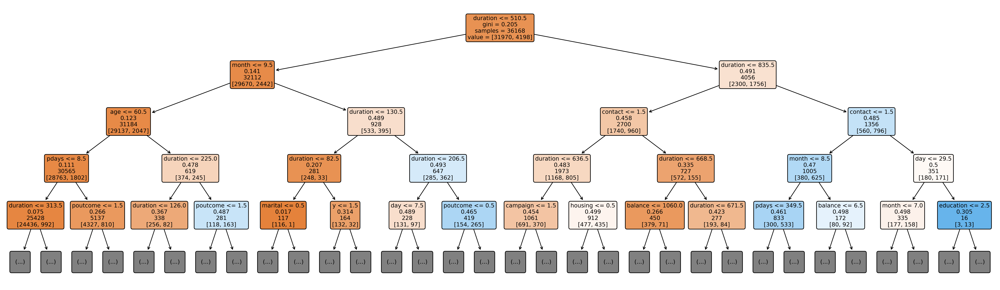

In [100]:
plt.figure(figsize=(28, 8), dpi=300)
plot_tree(tree2, feature_names=marketing.drop(columns="Id").columns, filled=True,  fontsize=9, label="root", rounded=True, max_depth=4);
# Value => (#class1, #class2)

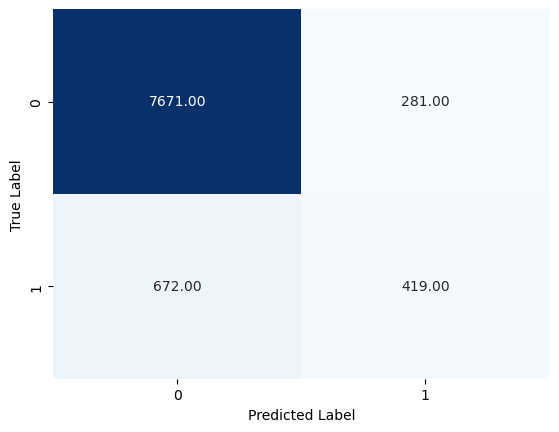

In [117]:
y_pred=tree2.predict(X_test)
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt=".2f", cbar=False)

plt.xlabel('Predicted Label')
plt.ylabel('True Label')


plt.show()

In [119]:
# classification report
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.92      0.96      0.94      7952
           1       0.60      0.38      0.47      1091

    accuracy                           0.89      9043
   macro avg       0.76      0.67      0.70      9043
weighted avg       0.88      0.89      0.88      9043



<h2 style="color : salmon" id="33">Saving the model<h2>

In [110]:
joblib.dump(tree2, 'Models/tree.joblib')

['tree.joblib']

In [ ]:
# TO load the model
# loaded_model = joblib.load('Models/tree.joblib')

<h1 style="color : skyblue" id="3.4">SVM Model<h1>

In [26]:
svc = SVC()
svc.fit(X_train, y_train)
print(f"train score : {svc.score(X_train, y_train)}")
print(f"test score : {svc.score(X_test, y_test)}")
print(f"cross validation score : {cross_val_score(svc, X_train, y_train, cv=5).mean()}")

train score : 0.8841517363415173
test score : 0.8794647793873714
cross validation score : 0.884179386853966


In [27]:
svc.get_params()

{'C': 1.0,
 'break_ties': False,
 'cache_size': 200,
 'class_weight': None,
 'coef0': 0.0,
 'decision_function_shape': 'ovr',
 'degree': 3,
 'gamma': 'scale',
 'kernel': 'rbf',
 'max_iter': -1,
 'probability': False,
 'random_state': None,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

<h2 style="color : salmon" id="35">GridSearch SVC<h2>

In [28]:
svc2 = SVC()

param_grid = {
    'degree': [2,3,5],
}

grid_search_svc = GridSearchCV(svc2, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

In [29]:
grid_search_svc.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=SVC(), n_jobs=-1, param_grid={'degree': [2, 3, 5]},
             scoring='accuracy')

In [34]:
grid_search_svc_df = pd.DataFrame(grid_search_svc.cv_results_)
grid_search_svc_df.style.background_gradient()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_degree,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,64.624359,4.875028,14.798752,0.738137,2,{'degree': 2},0.884020,0.884573,0.883882,0.884142,0.884280,0.884179,0.000237,1
1,62.840543,3.495856,15.147498,0.526872,3,{'degree': 3},0.884020,0.884573,0.883882,0.884142,0.884280,0.884179,0.000237,1
2,39.445412,17.041515,9.341944,4.611055,5,{'degree': 5},0.884020,0.884573,0.883882,0.884142,0.884280,0.884179,0.000237,1


In [36]:
# saving 
grid_search_svc_df.to_csv("GridSearchSVC.csv")

In [38]:
grid_search_svc.best_params_

{'degree': 2}

In [39]:

param_grid2 = {
    'C': [0.1, 1, 10,100]
}

grid_search_svc_c = GridSearchCV(svc2, param_grid2, scoring='accuracy', n_jobs=-1)



In [40]:
grid_search_svc_c.fit(X_train, y_train)

GridSearchCV(estimator=SVC(), n_jobs=-1, param_grid={'C': [0.1, 1, 10, 100]},
             scoring='accuracy')

In [42]:
grid_search_svc_c_df = pd.DataFrame(grid_search_svc_c.cv_results_)
grid_search_svc_c_df.style.background_gradient()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,65.813995,3.425231,15.882797,1.095096,0.100000,{'C': 0.1},0.883882,0.883882,0.883882,0.884004,0.884004,0.883931,0.000060,4
1,67.091746,3.459595,15.737985,0.941972,1,{'C': 1},0.884020,0.884573,0.883882,0.884142,0.884280,0.884179,0.000237,3
2,62.169419,10.854660,12.928320,2.862100,10,{'C': 10},0.884573,0.884988,0.883190,0.885248,0.883727,0.884345,0.000774,2
3,67.949445,3.400072,6.164513,0.744362,100,{'C': 100},0.886093,0.885955,0.884849,0.886216,0.883866,0.885396,0.000907,1


In [43]:
grid_search_svc_c.best_params_

{'C': 100}

In [44]:
grid_search_svc_c_df.to_csv("GridSearchSVC_c.csv")

In [47]:
SVC_best = SVC(degree=2, C=100)
SVC_best.fit(X_train, y_train)

SVC(C=100, degree=2)

In [48]:
print(f"train score : {SVC_best.score(X_train, y_train)}")
print(f"test score : {SVC_best.score(X_test, y_test)}")
print(f"cross validation score : {cross_val_score(SVC_best, X_train, y_train, cv=5).mean()}")

train score : 0.8858659588586596
test score : 0.8814552692690479
cross validation score : 0.8853959104664246


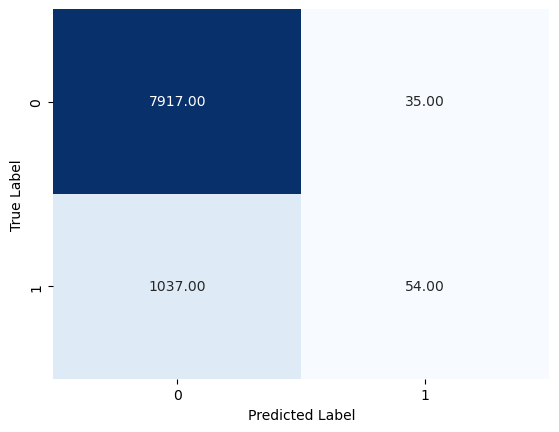

In [49]:
y_pred=SVC_best.predict(X_test)
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt=".2f", cbar=False)

plt.xlabel('Predicted Label')
plt.ylabel('True Label')


plt.show()

In [50]:
# classification report
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.88      1.00      0.94      7952
           1       0.61      0.05      0.09      1091

    accuracy                           0.88      9043
   macro avg       0.75      0.52      0.51      9043
weighted avg       0.85      0.88      0.83      9043



<h2 style="color : salmon" id="36">Saving the model<h2>

In [ ]:
# joblib.dump(svc, 'Models/svc.joblib')


In [ ]:
# TO load the model
# loaded_model = joblib.load('Models/svc.joblib')